# Cell Phones in 2022

This project is intended to train data to analyze and recommend cell phones based on different phone specifications. We have three different CSV files

1. Cellphone data.csv
> This data set contains information about 33 different mobile phones. Some of the features are screen size, weight, RAM, internal memory, etc. Overall, there are 13 different features.
2. Cellphone users.csv
> This dataset contains basic information related to 99 survey participants. Information includes gender, age and occupation.
3. Cellphone ratings.csv
> This data is being collected by conducting a survey where each participant rated 10 random phones from our above data set and rated from 1-10 based on how likely they are going to buy that particular phone

- [Importing Data](#Importing-data)
- [Data preprocessing and Exploratory Data Analysis](#Data-preprocessing)
- [Training Data](#Training-Data)
- [Insights](#Insights-and-further-study)

## Importing data

In [279]:
import pandas as pd
import numpy as np
import pandas_profiling as pp
import re

import matplotlib.pyplot as plt
%matplotlib inline

#### Importing the three csv files

In [280]:
d1=pd.read_csv('cellphones.csv')
#pp.ProfileReport(d1)

In [281]:
d2=pd.read_csv('cellphoneratings.csv')

In [305]:
d3=pd.read_csv('cellphoneusers.csv')

## Data preprocessing

#### Categorizing the occupation into three different categories

In [306]:
d3['occupation']=d3['occupation'].astype(str)

In [307]:
d3['occupation']=d3['occupation'].apply(str.capitalize)

In [308]:
d3['occupation'] = np.where(d3['occupation'].str.contains('Data analyst|Computer|It|Software|QA|it'), 'Information Technology',d3['occupation'])
d3['occupation'] = np.where(d3['occupation'].str.contains('Manager|manager|leader'), 'Management',d3['occupation'])      
d3['occupation'] = np.where(~d3['occupation'].str.contains('Information Technology|Management'), 'Other',d3['occupation'])  

In [309]:
d3.occupation.unique()

array(['Information Technology', 'Management', 'Other'], dtype=object)

*Below shows the number participants who belongs to each occupation criteria*

In [312]:
d3.groupby('occupation')['occupation'].count()

occupation
Information Technology    18
Management                26
Other                     55
Name: occupation, dtype: int64

In [313]:
d3.gender.unique()

array(['Female', 'Male', '-Select Gender-'], dtype=object)

Replacing '-Select Gender-' to Other

In [314]:
d3.gender=d3['gender'].replace('-Select Gender-','Other')

### Merging all three data files into a single dataframe

In [315]:
print(d1.shape)
print(d2.shape)
print(d3.shape)

(33, 14)
(990, 3)
(99, 4)


In [316]:
df=pd.merge(d1,d2,on='cellphone_id')

In [317]:
df=pd.merge(df,d3,on='user_id')

In [88]:
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [318]:
print(df.shape)

(990, 19)


Lets take a look at our data set

In [319]:
df.head()

,cellphone_id,brand,model,operating system,internal memory,RAM,performance,main camera,selfie camera,battery size,screen size,weight,price,release date,user_id,rating,age,gender,occupation
0,0,Apple,iPhone SE (2022),iOS,128,4,7.23,12,7,2018,4.7,144,429,18/03/2022,8,5,25,Female,Management
1,11,Samsung,Galaxy S22 Plus,Android,128,8,7.22,50,10,4500,6.6,195,899,25/02/2022,8,6,25,Female,Management
2,17,Google,Pixel 6 Pro,Android,128,12,7.19,50,11,5003,6.7,210,699,28/10/2021,8,8,25,Female,Management
3,20,OnePlus,10 Pro,Android,128,8,8.86,48,32,5000,6.7,201,780,11/01/2022,8,7,25,Female,Management
4,21,OnePlus,10T,Android,128,8,11.00,50,16,4800,6.7,204,649,06/08/2022,8,5,25,Female,Management


Below are the details about the response variable and features selected to be modeled

####  Response variable: cellphone_id
Features:
#### Categorical variables:
Brand,
OS,
Internal Memory,
RAM,
Gender,
Occupation,
#### Numerical Variables:
Battery size,
Weight,
main camera,
selfie camera,
screen size,
price,
rate

Here, few features like main camera, selfie camera, screen size will be factorized since we are only interested in distinct values of these features rather than as numerical variables.

### Exploratory Data Analysis

*Most of the mobile phones are android phones in the data set*

<AxesSubplot:xlabel='operating system'>

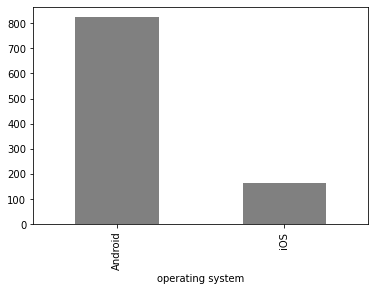

In [320]:
df.groupby('operating system').size().plot(kind='bar',color='grey')

*The dataset contains cell phones from 10 different brands as shown below.*

In [321]:
list(df.brand.unique())

['Apple',
 'Samsung',
 'Google',
 'OnePlus',
 'Oppo',
 'Xiaomi',
 'Motorola',
 'Asus',
 'Vivo',
 'Sony']

*There is a record with rating 18 which is not posssible since the rating is from 1-10. Looks like an outlier. Deleting this particular row from the data*

In [322]:
df[df['rating']>10]

,cellphone_id,brand,model,operating system,internal memory,RAM,performance,main camera,selfie camera,battery size,screen size,weight,price,release date,user_id,rating,age,gender,occupation
387,26,Xiaomi,12 Pro,Android,128,8,9.85,50,32,4600,6.7,204,618,31/12/2021,254,18,25,Female,Information Technology


*Deleting the above outlier entry since the rating cannot be greater than 10.*

In [323]:
df.drop([387],axis=0,inplace=True)

*Below table shows the different cell phones with their companies.*

In [324]:
d1[['brand','model']]

,brand,model
0,Apple,iPhone SE (2022)
1,Apple,iPhone 13 Mini
2,Apple,iPhone 13
3,Apple,iPhone 13 Pro
4,Apple,iPhone 13 Pro Max
5,Apple,iPhone XR
6,Asus,Zenfone 8
7,Samsung,Galaxy A13
8,Samsung,Galaxy A32
9,Samsung,Galaxy A53


#### The below graph shows that iPhone 13 Pro has got most number of 10 ratings among all other phones

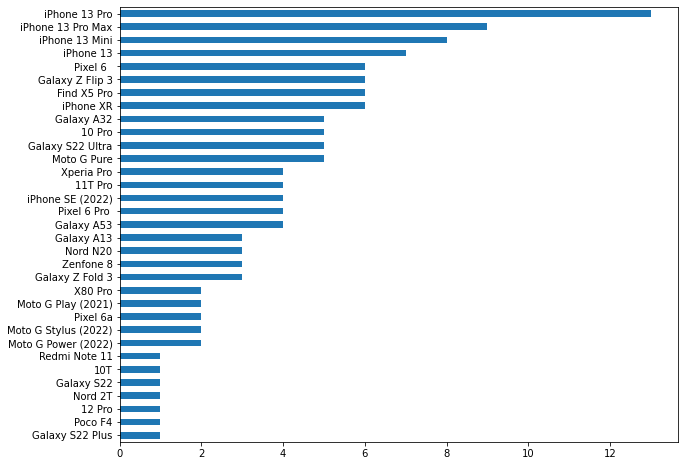

In [325]:
plt.figure(figsize=(10,8))
df.model[df['rating']==10].value_counts().sort_values().plot(kind='barh')
plt.show()

*High performance phones in the list*

*Phone with highest perfomrance is one plus 10T, iphone 13 which has got maximum 10 ratings has a performance below 8*

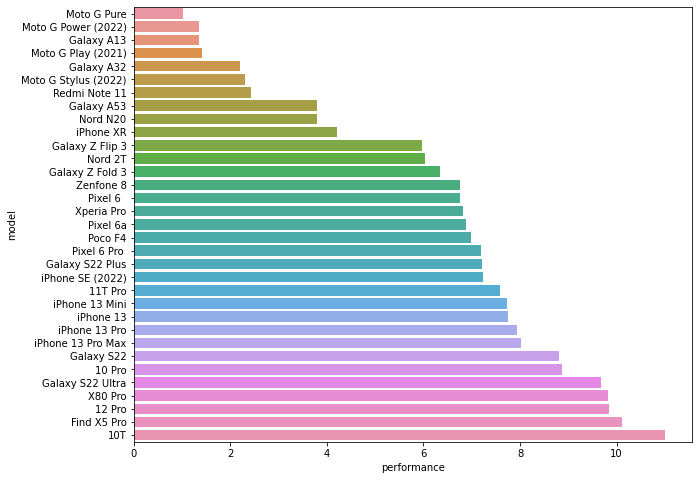

In [326]:
plt.figure(figsize=(10,8))
sns.barplot(data=d1,x='performance',y='model',order=d1.sort_values('performance').model)
plt.show()

### Factorizing features

In [327]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 989 entries, 0 to 989
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cellphone_id      989 non-null    int64  
 1   brand             989 non-null    object 
 2   model             989 non-null    object 
 3   operating system  989 non-null    object 
 4   internal memory   989 non-null    int64  
 5   RAM               989 non-null    int64  
 6   performance       989 non-null    float64
 7   main camera       989 non-null    int64  
 8   selfie camera     989 non-null    int64  
 9   battery size      989 non-null    int64  
 10  screen size       989 non-null    float64
 11  weight            989 non-null    int64  
 12  price             989 non-null    int64  
 13  release date      989 non-null    object 
 14  user_id           989 non-null    int64  
 15  rating            989 non-null    int64  
 16  age               989 non-null    int64  
 1

In [328]:
df['internal memory'] = pd.factorize(df['internal memory'])[0]
df['main camera'] = pd.factorize(df['main camera'])[0]
df['selfie camera'] = pd.factorize(df['selfie camera'])[0]
df['screen size'] = pd.factorize(df['screen size'])[0]
df['cellphone_id'] = pd.factorize(df['cellphone_id'])[0]
df['gender']=pd.factorize(df['gender'])[0]
df['operating system']=pd.factorize(df['operating system'])[0]
df['occupation']=pd.factorize(df['occupation'])[0]

In [329]:
df.head()

,cellphone_id,brand,model,operating system,internal memory,RAM,performance,main camera,selfie camera,battery size,screen size,weight,price,release date,user_id,rating,age,gender,occupation
0,0,Apple,iPhone SE (2022),0,0,4,7.23,0,0,2018,0,144,429,18/03/2022,8,5,25,0,0
1,1,Samsung,Galaxy S22 Plus,1,0,8,7.22,1,1,4500,1,195,899,25/02/2022,8,6,25,0,0
2,2,Google,Pixel 6 Pro,1,0,12,7.19,1,2,5003,2,210,699,28/10/2021,8,8,25,0,0
3,3,OnePlus,10 Pro,1,0,8,8.86,2,3,5000,2,201,780,11/01/2022,8,7,25,0,0
4,4,OnePlus,10T,1,0,8,11.00,1,4,4800,2,204,649,06/08/2022,8,5,25,0,0


## Training Data

### Extracting response varibale, features and dividing them into training and test data set

In [330]:
from sklearn.model_selection import train_test_split
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import ConfusionMatrixDisplay
import seaborn as sns

*Dropping the columns which are not considered as features along with response variable*

In [331]:
x=df.drop(['brand','model','cellphone_id','release date','user_id'],axis=1)
y=df.cellphone_id

*Divided the whole data set into 50-50 as training and test data set*

In [332]:
x_train,x_test,y_train,y_test=train_test_split(x,y,train_size=0.5,random_state=0)


### Training the data with different models

The following models will be used for training the data. After fitting, the accuracy score will be calculated for each model using the test data and a confsuion matrix will be generated.

- KNN Model
- LDA Model
- MLP Calssifier with two hidden layers

Feature importances will be identified using random forest classifier.

## KNN model

In [333]:
knn_model=KNeighborsClassifier(10)
knn_model.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=10)

In [334]:
knn_preds=knn_model.predict(x_test)

In [335]:

acc = accuracy_score(y_test, knn_preds)
print('\nThe accuracy is: ', acc)


The accuracy is:  0.9939393939393939


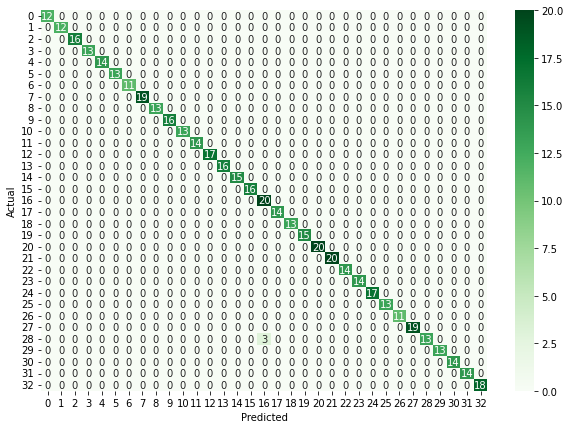

In [336]:
data={'True label':y_test, 'Predicted label':knn_preds}

df_result= pd.DataFrame(data).reset_index()
confusion_matrix = pd.crosstab(df_result['True label'], df_result['Predicted label'], rownames=['Actual'], colnames=['Predicted'])
pd.set_option('display.max_columns', None)
# print(confusion_matrix)

plt.figure(figsize=(10,7))
sns.heatmap(confusion_matrix,cmap='Greens',annot=True)
plt.show()


## LDA model

In [337]:
lda_model=LinearDiscriminantAnalysis()
lda_model.fit(x_train,y_train)
lda_preds=lda_model.predict(x_test)

In [338]:
acc = accuracy_score(y_test, lda_preds)
print('\nThe accuracy is: ', acc)


The accuracy is:  0.9676767676767677


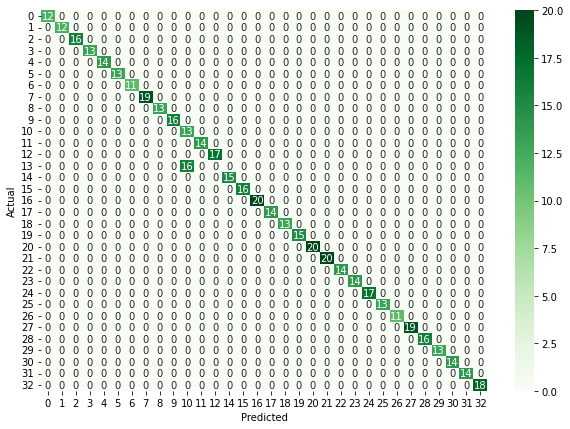

In [339]:
data={'True label':y_test, 'Predicted label':lda_preds}

df_result= pd.DataFrame(data).reset_index()
confusion_matrix = pd.crosstab(df_result['True label'], df_result['Predicted label'], rownames=['Actual'], colnames=['Predicted'])
pd.set_option('display.max_columns', None)
#print(confusion_matrix)

plt.figure(figsize=(10,7))
sns.heatmap(confusion_matrix,cmap='Greens',annot=True)
plt.show()

## MLP Classifier

In [340]:
nn_model = MLPClassifier(hidden_layer_sizes=(10,10), max_iter=5000, activation='relu', random_state=1)
nn_model.fit(x_train,y_train)
nn_preds=nn_model.predict(x_test)

In [341]:
acc = accuracy_score(y_test, nn_preds)
print('\nThe accuracy is: ', acc)


The accuracy is:  0.2404040404040404


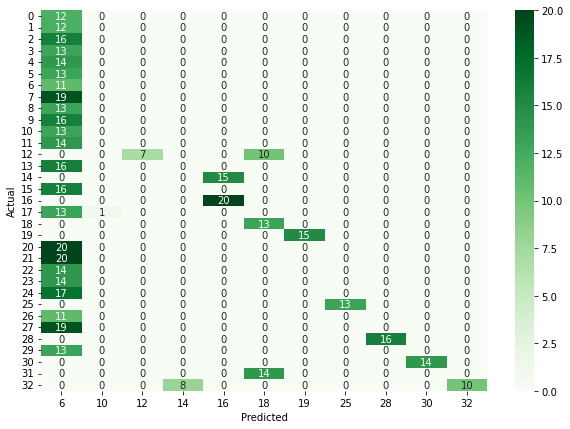

In [342]:
data={'True label':y_test, 'Predicted label':nn_preds}

df_result= pd.DataFrame(data).reset_index()
confusion_matrix = pd.crosstab(df_result['True label'], df_result['Predicted label'], rownames=['Actual'], colnames=['Predicted'])
pd.set_option('display.max_columns', None)
#print(confusion_matrix)
plt.figure(figsize=(10,7))
sns.heatmap(confusion_matrix,cmap='Greens',annot=True)
plt.show()

## Feature Importances

In [343]:
rf_model=RandomForestClassifier()
rf_model.fit(x_train,y_train)
rf_preds=rf_model.predict(x_test)


In [344]:
# data={'True label':y_test, 'Predicted label':rf_preds}

# df_result= pd.DataFrame(data).reset_index()
# confusion_matrix = pd.crosstab(df_result['True label'], df_result['Predicted label'], rownames=['Actual'], colnames=['Predicted'])
# pd.set_option('display.max_columns', None)
# #print(confusion_matrix)
# plt.figure(figsize=(13,10))
# sns.heatmap(confusion_matrix,cmap='Greens',annot=True)
# plt.show()

In [345]:
print(rf_model.feature_importances_)
print(x.columns)
# plt.barh(x.feature_names[sort], rf_model.feature_importances_[sort])
# plt.xlabel("Feature Importance")

[0.02165598 0.05552707 0.07394424 0.14154744 0.08594751 0.11310624
 0.10345414 0.09203723 0.14342582 0.15632188 0.00428545 0.00403627
 0.00271509 0.00199564]
Index(['operating system', 'internal memory', 'RAM', 'performance',
       'main camera', 'selfie camera', 'battery size', 'screen size', 'weight',
       'price', 'rating', 'age', 'gender', 'occupation'],
      dtype='object')


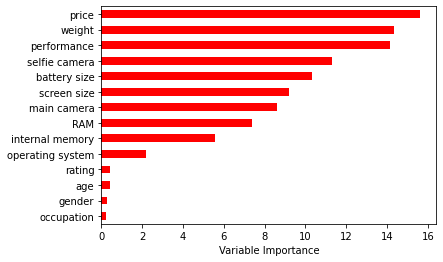

In [346]:
Importance = pd.DataFrame({'Importance':rf_model.feature_importances_*100}, index=x.columns)
Importance.sort_values(by='Importance', axis=0, ascending=True).plot(kind='barh', color='r', )
plt.xlabel('Variable Importance')
plt.gca().legend_ = None

## Insights and further study

|Model  |Accuracy Score|
|-------|--------------|
|kNN    |   0.9939     |
|LDA    |   0.9677     |
|MLP    |   0.2404     |

All the models except Multi Layer Perceptron has given an accuracy score greater than 0.95. Among all the features as per random forest feature importances, performance, weight and price of the cell phones have most effect on the cellphones according to random forest algorithm. The feature importances values keep on changing. However, price, weight and performance always stay at top three

**Further study**

- Adding released date as features
- Transforming the price and rating column to a range of values
- Trying out different k values and different algorithms to see which model is more efficient
- Trying out other possible algorithms to identify feature importances rather than random forest.